# Dynamic Wakes 1

## Wake propagation in heterogeneous backgrounds

_foxes_ can model dynamic wake propagation for timeseries inflow states based on passive transport of the wake flow by the ambient wind vectors. This can be switched on by selecting a wake frame of  `DynamicWakes` type.

Since all `foxes` computations are based on _chunks_ of input states, wake propagation only works if

- either all states fall into a single chunk,
- or the `Iterative` algorithm is used for the calculation.

The reason is that in cases where the wake originates from a state that belongs to a chunk previous to the chunk of evaluation, data has to be passed between two different chunks. This is not possible with the default `Downwind` algorithm, since it does not allow cross-chunk communication. Hence iterative computations are required for muti-chunk cases with dynamic wakes.

These are the imports for this example:

In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.rcParams["animation.html"] = "jshtml"

import foxes
import foxes.constants as FC
import foxes.variables as FV

We start by defining timeseries inflow at a single point. For this example we modify the wind speed data of the underlying data file (which is shipped as part of _foxes_ provided static data), in order to include oscillating time variations:

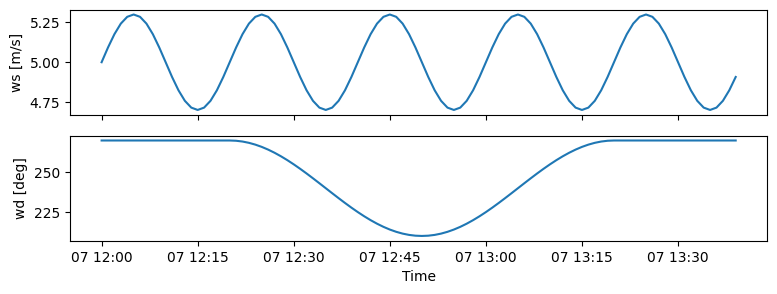

In [2]:
sdata = pd.read_csv(
    foxes.StaticData().get_file_path(foxes.STATES, "timeseries_100.csv.gz"),
    index_col=0,
    parse_dates=[0],
)
n_times = len(sdata.index)
sdata["ws"] = 5 + 0.3*np.sin(np.arange(n_times)*2*np.pi/20)

fig, axs = plt.subplots(2,1, figsize=(9,3), sharex=True)
axs[0].plot(sdata.index, sdata.ws)
axs[0].set_ylabel("ws [m/s]")
axs[1].plot(sdata.index, sdata.wd)
axs[1].set_xlabel("Time")
axs[1].set_ylabel("wd [deg]")
plt.show()

The above data are defined at a single point. Since we are interested in inhomogeneous background flows, we plug this into the `OnePointFlowTimeseries` states class in the following. This inflow propagates the given local information from the given `ref_xy` location to any other point of evaluation. Similarly to the dynamic wakes approach, this is also based on passive transport by time dependent flow vectors and travel time. Note that this implies that this inflow requires the `Iterative` algorithm, also when combined with non-dynamic wake frames.

In [3]:
ref_xy = [2500, 2500]
states = foxes.input.states.OnePointFlowTimeseries(
    data_source=sdata,
    output_vars=[FV.WS, FV.WD, FV.TI, FV.RHO],
    var2col={FV.WS: "ws", FV.WD: "wd", FV.TI: "ti"},
    fixed_vars={FV.RHO: 1.225, FV.TI: 0.07},
    ref_xy=ref_xy,
)

We investigate the wakes of a simple 3 x 3 regular wind farm:

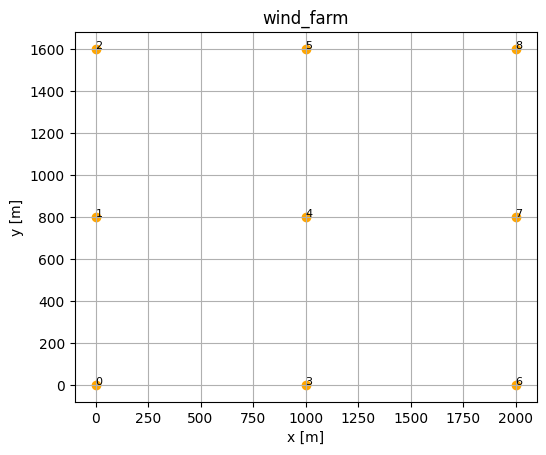

In [4]:
farm = foxes.WindFarm()
foxes.input.farm_layout.add_grid(
    farm,
    xy_base=np.array([0.0, 0.0]),
    step_vectors=np.array([[1000.0, 0], [0, 800.0]]),
    steps=(3, 3),
    turbine_models=["DTU10MW"],
    verbosity=0,
)

ax = foxes.output.FarmLayoutOutput(farm).get_figure()
plt.show()

As stressed above, the iterative approach is required for this case. Here we select the `DynamicWakes` wake frame with maximal wake length of 8 km, which is called `dyn_wakes_8km` in the model book. Similarly, any other maximal wake length can be specified. Note that the choice of maximal wake length, in combination with the number of chunks, determines the number of iterations during calculations. 

In [5]:
algo = foxes.algorithms.Iterative(
    farm,
    states=states,
    rotor_model="centre",
    wake_models=["Bastankhah2014_linear_loc_k004"],
    wake_frame="dyn_wakes_8km",
    verbosity=1,
)

Notice the usage of the `linear_loc` wake superposition, which rescales the linearly added dimensionless wake deficits to the local ambient wind speed at any point of evaluation, in contrast to the rotor equivalent wind speed at the wake causing turbine as for the choice `linear`. Other choices with such rescaling are `quadratic_loc`, `cubic_loc`, `quartic_loc`, and also `product` superposition (note that it is not required to select a local superposition for dynamic wakes).

Now let's run the distributed computations via the pool of parallel processes:

In [6]:
with foxes.Engine.new("process"):
    farm_results = algo.calc_farm()


Algorithm Iterative: Iteration 0

Calculating 100 states for 9 turbines


Computing 15 chunks using 15 processes


  0%|                                                                                                   | 0/15 [00:00<?, ?it/s]

  7%|██████                                                                                     | 1/15 [00:00<00:01,  7.45it/s]

 27%|████████████████████████▎                                                                  | 4/15 [00:00<00:00, 17.09it/s]

 40%|████████████████████████████████████▍                                                      | 6/15 [00:00<00:00, 17.53it/s]

 73%|██████████████████████████████████████████████████████████████████                        | 11/15 [00:00<00:00, 28.03it/s]

100%|██████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 29.60it/s]

Iterative: Convergence blocked

Algorithm Iterative: Iteration 1

Calculating 100 states for 9 turbines
Computing 15 chunks using 15 processes


  0%|                                                                                                   | 0/15 [00:00<?, ?it/s]

 13%|████████████▏                                                                              | 2/15 [00:00<00:01, 10.25it/s]

 33%|██████████████████████████████▎                                                            | 5/15 [00:00<00:00, 16.30it/s]

 47%|██████████████████████████████████████████▍                                                | 7/15 [00:00<00:00, 10.19it/s]

 67%|████████████████████████████████████████████████████████████                              | 10/15 [00:00<00:00, 13.32it/s]

100%|██████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 18.59it/s]

Iterative: Convergence blocked

Algorithm Iterative: Iteration 2

Calculating 100 states for 9 turbines
Computing 15 chunks using 15 processes


  0%|                                                                                                   | 0/15 [00:00<?, ?it/s]

 13%|████████████▏                                                                              | 2/15 [00:00<00:01, 10.20it/s]

 27%|████████████████████████▎                                                                  | 4/15 [00:00<00:00, 11.76it/s]

 40%|████████████████████████████████████▍                                                      | 6/15 [00:00<00:00, 13.57it/s]

 53%|████████████████████████████████████████████████▌                                          | 8/15 [00:00<00:00,  9.75it/s]

100%|██████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 17.94it/s]

Iterative: Convergence blocked

Algorithm Iterative: Iteration 3

Calculating 100 states for 9 turbines
Computing 15 chunks using 15 processes


  0%|                                                                                                   | 0/15 [00:00<?, ?it/s]

 20%|██████████████████▏                                                                        | 3/15 [00:00<00:00, 18.14it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, -23.74it/s]

Iterative: Convergence blocked

Algorithm Iterative: Iteration 4

Calculating 100 states for 9 turbines
Computing 15 chunks using 15 processes


  0%|                                                                                                   | 0/15 [00:00<?, ?it/s]

 20%|██████████████████▏                                                                        | 3/15 [00:00<00:00, 19.72it/s]

 33%|██████████████████████████████▎                                                            | 5/15 [00:00<00:00, 17.84it/s]

 60%|██████████████████████████████████████████████████████▌                                    | 9/15 [00:00<00:00, 21.53it/s]

100%|██████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 31.52it/s]

Iterative: Convergence blocked

Algorithm Iterative: Iteration 5

Calculating 100 states for 9 turbines
Computing 15 chunks using 15 processes


  0%|                                                                                                   | 0/15 [00:00<?, ?it/s]

 27%|████████████████████████▎                                                                  | 4/15 [00:00<00:00, 17.95it/s]

 60%|██████████████████████████████████████████████████████▌                                    | 9/15 [00:00<00:00, 23.93it/s]

100%|██████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 30.64it/s]

Iterative: Convergence blocked

Algorithm Iterative: Iteration 6

Calculating 100 states for 9 turbines
Computing 15 chunks using 15 processes


  0%|                                                                                                   | 0/15 [00:00<?, ?it/s]

 27%|████████████████████████▎                                                                  | 4/15 [00:00<00:00, 15.44it/s]

 60%|██████████████████████████████████████████████████████▌                                    | 9/15 [00:00<00:00, 22.07it/s]

100%|██████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 31.30it/s]

100%|██████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 27.24it/s]

Iterative: Convergence blocked

Algorithm Iterative: Iteration 7

Calculating 100 states for 9 turbines
Computing 15 chunks using 15 processes


  0%|                                                                                                   | 0/15 [00:00<?, ?it/s]

 33%|██████████████████████████████▎                                                            | 5/15 [00:00<00:00, 22.32it/s]

 80%|████████████████████████████████████████████████████████████████████████                  | 12/15 [00:00<00:00, 38.96it/s]

100%|██████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 41.14it/s]

Iterative: Convergence blocked

Algorithm Iterative: Iteration 8

Calculating 100 states for 9 turbines
Computing 15 chunks using 15 processes


  0%|                                                                                                   | 0/15 [00:00<?, ?it/s]

 33%|██████████████████████████████▎                                                            | 5/15 [00:00<00:00, 25.25it/s]

 87%|██████████████████████████████████████████████████████████████████████████████            | 13/15 [00:00<00:00, 41.72it/s]

100%|██████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 42.02it/s]

Iterative: Convergence blocked

Algorithm Iterative: Iteration 9

Calculating 100 states for 9 turbines
Computing 15 chunks using 15 processes


  0%|                                                                                                   | 0/15 [00:00<?, ?it/s]

 47%|██████████████████████████████████████████▍                                                | 7/15 [00:00<00:00, 64.58it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████      | 14/15 [00:00<00:00, 61.97it/s]

100%|██████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 61.19it/s]


DefaultConv: Convergence check
  REWS: delta = 0.000e+00, lim = 1.000e-06  --  OK
  TI  : delta = 0.000e+00, lim = 1.000e-07  --  OK
  CT  : delta = 0.000e+00, lim = 1.000e-07  --  OK

Algorithm Iterative: Convergence reached.

Starting final run
Calculating 100 states for 9 turbines
Computing 15 chunks using 15 processes


  0%|                                                                                                   | 0/15 [00:00<?, ?it/s]

 40%|████████████████████████████████████▍                                                      | 6/15 [00:00<00:00, 53.99it/s]

 80%|████████████████████████████████████████████████████████████████████████                  | 12/15 [00:00<00:00, 57.13it/s]

100%|██████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 58.55it/s]

Notice that the convergence is "blocked" until all wakes have reached the selected maximal wake length. 

These are the resulting rotor effective wind speed results at the middle row of turbines (indices 1, 4, 7):

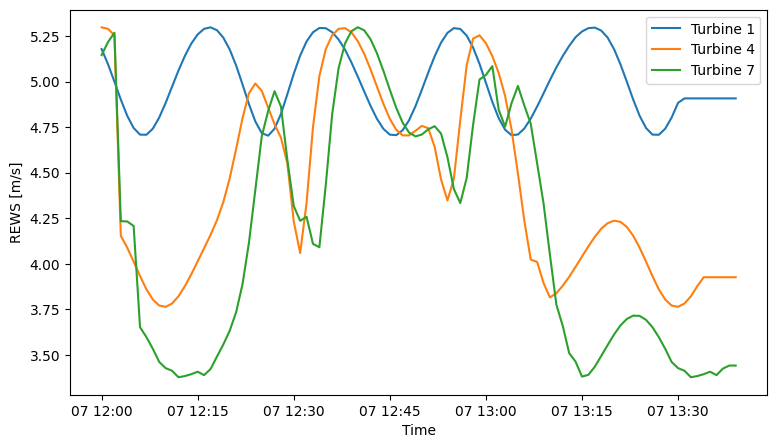

In [7]:
fig, ax = plt.subplots(figsize=(9,5))
ax.plot(farm_results[FC.STATE], farm_results[FV.REWS][:, 1], label="Turbine 1")
ax.plot(farm_results[FC.STATE], farm_results[FV.REWS][:, 4], label="Turbine 4")
ax.plot(farm_results[FC.STATE], farm_results[FV.REWS][:, 7], label="Turbine 7")
ax.legend()
ax.set_xlabel("Time")
ax.set_ylabel("REWS [m/s]")
plt.show()

Now let's have a look at the wind field dynamics. We do so by creating an output `Animator` to which we add a flow plot generator:

In [8]:
with foxes.Engine.new("process", chunk_size_points=3000):

    fig, axs = plt.subplots(2, 1, figsize=(5.2,7), 
                            gridspec_kw={'height_ratios': [3, 1]})
    
    anim = foxes.output.Animator(fig)
    
    # this adds the flow anomation to the upper panel:
    of = foxes.output.FlowPlots2D(algo, farm_results)
    anim.add_generator(
        of.gen_states_fig_xy(
            FV.WS,
            resolution=30,
            quiver_pars=dict(scale=0.013),
            quiver_n=35,
            xmax=5000,
            ymax=5000,
            fig=fig,
            ax=axs[0],
            vmin=0,
            title=lambda si, s: f"t = {si/6:3.2f} min",
            ret_im=True,
            animated=True,
        )
    )

    # This adds the REWS signal animation to the lower panel:
    o = foxes.output.FarmResultsEval(farm_results)
    anim.add_generator(
        o.gen_stdata(
            turbines=[1, 4, 7],
            variable=FV.REWS,
            fig=fig,
            ax=axs[1],
            ret_im=True,
            legloc="upper right",
            animated=True,
        )
    )
    
    # This adds turbine indices at turbine positions:
    lo = foxes.output.FarmLayoutOutput(farm)
    lo.get_figure(
        fig=fig,
        ax=axs[0],
        title="",
        annotate=1,
        anno_delx=-120,
        anno_dely=-60,
        alpha=0,
    )
    
    ani = anim.animate()

    # This adds a cross for the inflow measurement point
    axs[0].scatter(
        [ref_xy[0]], [ref_xy[1]], 
        marker="x", color="red", s=80, animated=True
    )
    
    plt.close()
    print("done.")
    
print("Creating animation")
ani

Creating animation data
Calculating data at 33856 points for 100 states


Computing 180 chunks using 15 processes


  0%|                                                                                                  | 0/180 [00:00<?, ?it/s]

 20%|█████████████████▌                                                                      | 36/180 [00:00<00:00, 343.93it/s]

 39%|███████████████████████████████████                                                      | 71/180 [00:01<00:02, 50.16it/s]

 48%|███████████████████████████████████████████                                              | 87/180 [00:01<00:02, 38.50it/s]

 54%|███████████████████████████████████████████████▉                                         | 97/180 [00:02<00:02, 35.19it/s]

 58%|██████████████████████████████████████████████████▊                                     | 104/180 [00:02<00:02, 35.02it/s]

 61%|█████████████████████████████████████████████████████▊                                  | 110/180 [00:02<00:02, 29.38it/s]

 67%|███████████████████████████████████████████████████████████▏                            | 121/180 [00:03<00:01, 30.82it/s]

 70%|█████████████████████████████████████████████████████████████▌                          | 126/180 [00:03<00:01, 27.82it/s]

 74%|█████████████████████████████████████████████████████████████████                       | 133/180 [00:03<00:01, 26.55it/s]

 76%|██████████████████████████████████████████████████████████████████▉                     | 137/180 [00:03<00:01, 26.34it/s]

 81%|██████████████████████████████████████████████████████████████████████▉                 | 145/180 [00:04<00:01, 26.71it/s]

 83%|████████████████████████████████████████████████████████████████████████▊               | 149/180 [00:04<00:01, 26.63it/s]

 87%|████████████████████████████████████████████████████████████████████████████▊           | 157/180 [00:04<00:00, 26.28it/s]

 89%|██████████████████████████████████████████████████████████████████████████████▏         | 160/180 [00:04<00:00, 23.63it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████▌     | 169/180 [00:05<00:00, 24.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████| 180/180 [00:05<00:00, 34.13it/s]

done.
Creating animation


The red cross in the animation marks the location at which the inflow data was given.